<a href="https://colab.research.google.com/github/ZPavlo/ClusteringComparing/blob/main/Spectral_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline
import sys
import os
from google.colab import drive
drive.mount('/content/gdrive')
ROOT_DATA = '/content/gdrive/MyDrive/datasets/clustering_data'
SAVE_FORLDER = "/content/gdrive/MyDrive/datasets/images"

if not os.path.isdir(SAVE_FORLDER):
    os.mkdir(SAVE_FORLDER)

Mounted at /content/gdrive


In [2]:
!git clone https://github.com/ZPavlo/ClusteringComparing.git
sys.path.insert(0, "/content/ClusteringComparing")

Cloning into 'ClusteringComparing'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 101 (delta 63), reused 57 (delta 25), pack-reused 0
Receiving objects: 100% (101/101), 1.83 MiB | 10.29 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [3]:
!cd ClusteringComparing && git pull

Already up to date.


In [4]:
!pip install sklearn_extras
!pip install scikit-learn-extra
!pip install scikit-learn

  Created wheel for sklearn-extras: filename=sklearn_extras-0.1.1-cp37-none-any.whl size=2206 sha256=98d312575b9d4b233f21f6b592980fe5a89109b38074e6e45bfd6231cd330cc3
  Stored in directory: /root/.cache/pip/wheels/40/95/76/5c740a32631c60dd991fef0730234cd215f39acb898862a502
Successfully built sklearn-extras
     |████████████████████████████████| 1.7MB 4.9MB/s 
     |████████████████████████████████| 22.3MB 4.9MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

sns.set()

## Datasets

In [6]:
from tools import make_plot

### Gaussian blobs

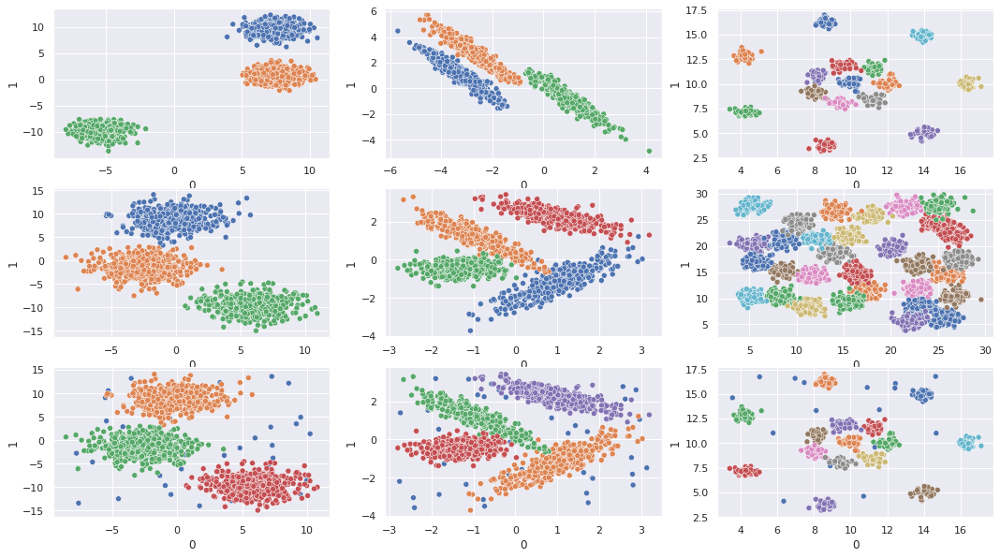

In [7]:
from datasets import get_data_blobs, get_data_blobs2, get_data_blobs3, \
                     get_data_blobs4, get_data_R15, get_data_d31, get_gaussian_data_3d, \
                     get_data_blobs2_noise, get_data_blobs4_noise, get_data_R15_noise, \
                     GAUSSIAN_BLOBS_DATA, GAUSSIAN_BLOBS_K 

fig, axes = plt.subplots(3, 3, figsize=(18, 10))

make_plot(*get_data_blobs(), axes=axes[0, 0])
make_plot(*get_data_blobs3(), axes=axes[0, 1])
make_plot(*get_data_R15(path=ROOT_DATA), axes=axes[0, 2])

make_plot(*get_data_blobs2(), axes=axes[1, 0])
make_plot(*get_data_blobs4(), axes=axes[1, 1])
make_plot(*get_data_d31(path=ROOT_DATA), axes=axes[1, 2])

make_plot(*get_data_blobs2_noise(), axes=axes[2, 0])
make_plot(*get_data_blobs4_noise(), axes=axes[2, 1])
make_plot(*get_data_R15_noise(path=ROOT_DATA), axes=axes[2, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian.png"))
plt.show()

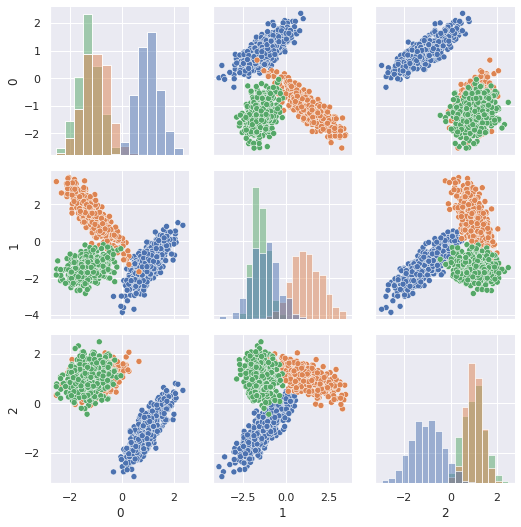

In [8]:
from tools import make_3d_plot

X, y = get_gaussian_data_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian3d.png"))
plt.show()

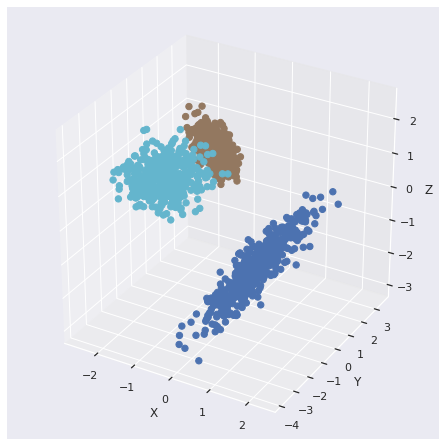

In [9]:
from tools import make_3d_plot

make_3d_plot(X, y)

### Unbalance Gaussian

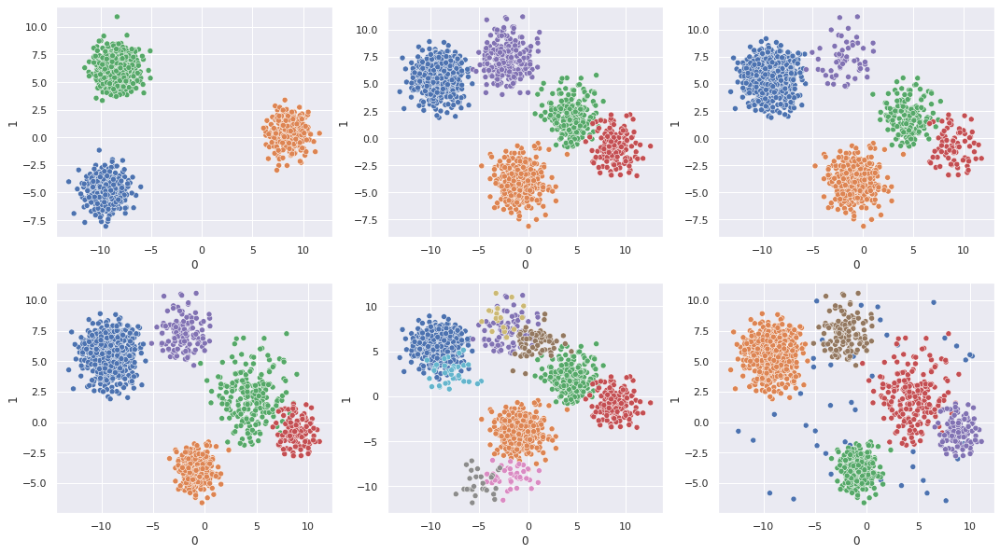

In [10]:
from datasets import get_data_unbalance1, get_data_unbalance2, get_data_unbalance3, \
                     get_data_unbalance4, get_data_unbalance5, get_data_unbalance6, \
                     UNBALANCED_GAUSSIAN_BLOBS_DATA, UNBALANCED_GAUSSIAN_BLOBS_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_unbalance1(), axes=axes[0, 0])
make_plot(*get_data_unbalance2(), axes=axes[0, 1])
make_plot(*get_data_unbalance3(), axes=axes[0, 2])
make_plot(*get_data_unbalance4(), axes=axes[1, 0])
make_plot(*get_data_unbalance5(), axes=axes[1, 1])
make_plot(*get_data_unbalance6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "unbalance gaussian.png"))
plt.show()

### Cube 

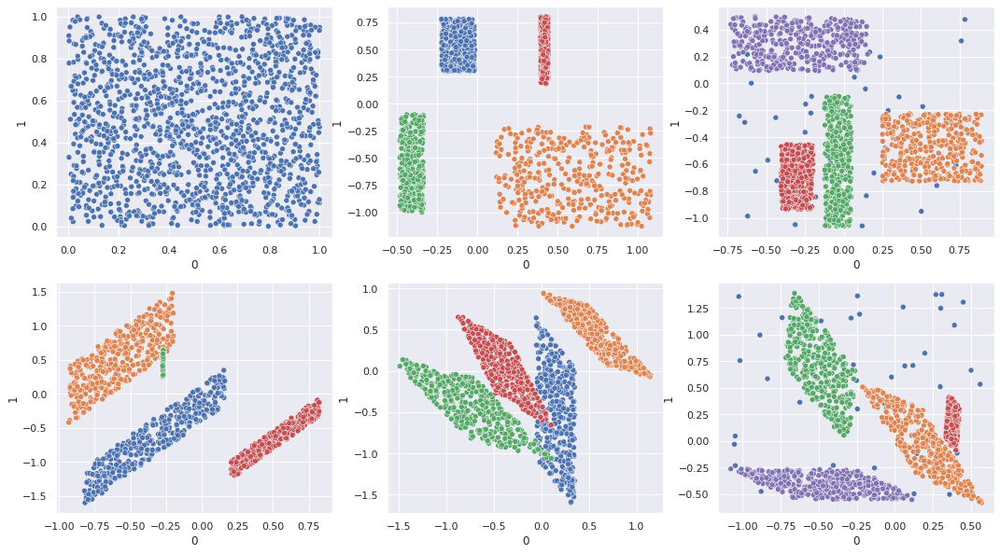

In [11]:
from datasets import get_data_cube, get_data_cube2, get_data_cube3, \
                     get_data_cube4, get_data_cube5, get_data_cube6, \
                     get_data_cube_3d, CUBES_RECT_PARALLEL_DATA, CUBES_RECT_PARALLEL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_cube(), axes=axes[0, 0])
make_plot(*get_data_cube2(), axes=axes[0, 1])
make_plot(*get_data_cube3(), axes=axes[1, 0])
make_plot(*get_data_cube4(), axes=axes[1, 1])
make_plot(*get_data_cube5(), axes=axes[0, 2])
make_plot(*get_data_cube6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "cube.png"))
plt.show()

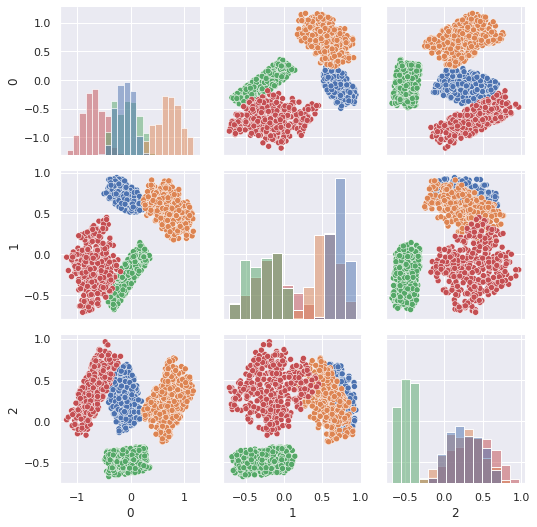

In [12]:
X, y = get_data_cube_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "cube3d.png"))
plt.show()

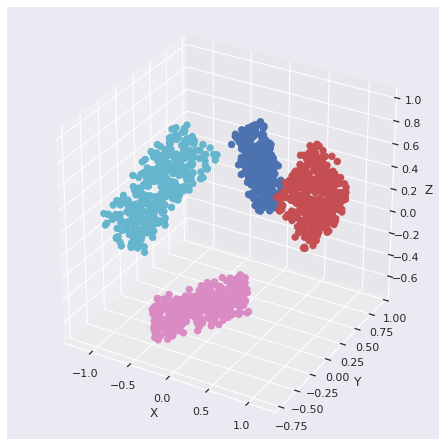

In [13]:
make_3d_plot(X, y)

### Non-spherical

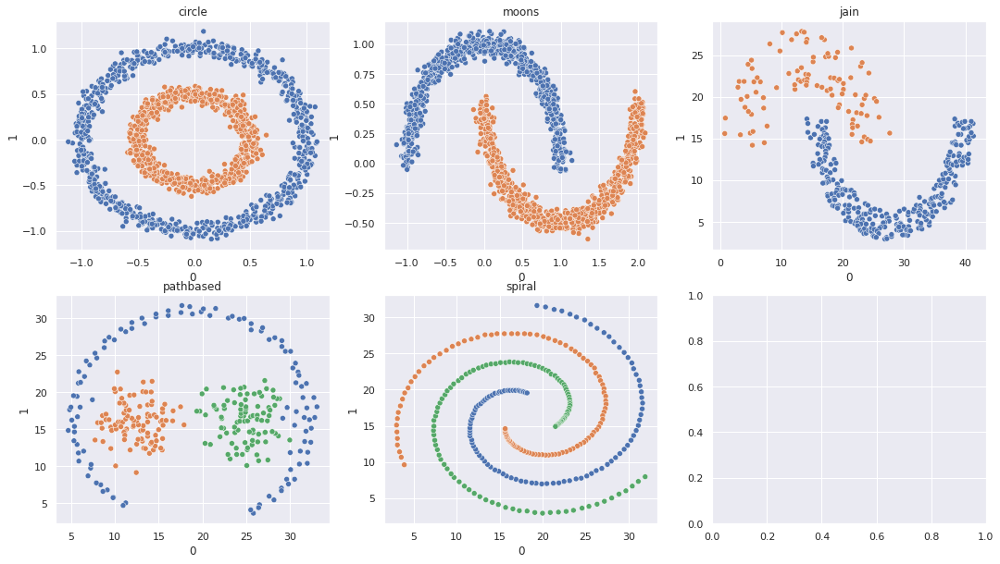

In [14]:
from datasets import get_data_circle, get_data_moons, get_data_jain, \
                     get_data_pathbased, get_data_spiral, NON_SPHERICAL_DATA, \
                     NON_SPHERICAL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_circle(), axes=axes[0, 0], title="circle")
make_plot(*get_data_moons(), axes=axes[0, 1], title="moons")
make_plot(*get_data_jain(path=ROOT_DATA), axes=axes[0, 2], title="jain")
make_plot(*get_data_pathbased(path=ROOT_DATA), axes=axes[1, 0], title="pathbased")
make_plot(*get_data_spiral(path=ROOT_DATA), axes=axes[1, 1], title="spiral")

plt.savefig(os.path.join(SAVE_FORLDER, "non-spherical.png"))
plt.show()

### Combining forms

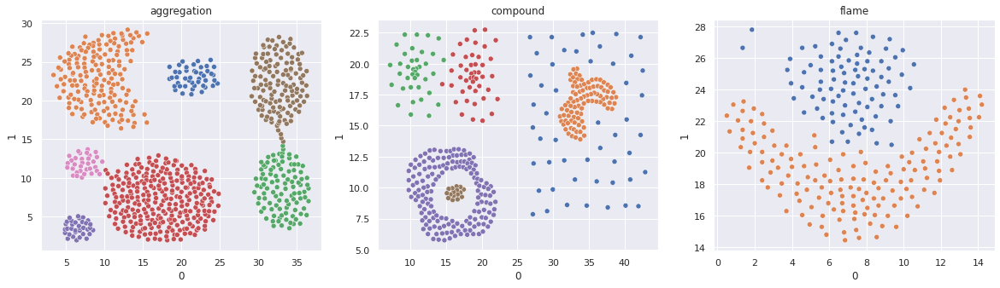

In [15]:
from datasets import get_data_aggregation, get_data_compound, get_data_flame, \
                     get_data_cube, OTHER_FORMS_DATA, OTHER_FORMS_K



fig, axes = plt.subplots(1, 3, figsize=(20, 5))

make_plot(*get_data_aggregation(path=ROOT_DATA), axes=axes[0], title="aggregation")
make_plot(*get_data_compound(path=ROOT_DATA), axes=axes[1], title="compound")
make_plot(*get_data_flame(path=ROOT_DATA), axes=axes[2], title="flame")

plt.savefig(os.path.join(SAVE_FORLDER, "combining forms.png"))
plt.show()

## Data clustering

In [16]:
import numpy as np

from spectralclustering_utils import run_SpectralClustering_on_data_with_K, \
run_SpectralClustering_on_data, run_on_3d_data

In [17]:
import os

if not os.path.exists(os.path.join(ROOT_DATA, "images")):
    os.mkdir(os.path.join(ROOT_DATA, "images"))

### Gaussian blobs

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


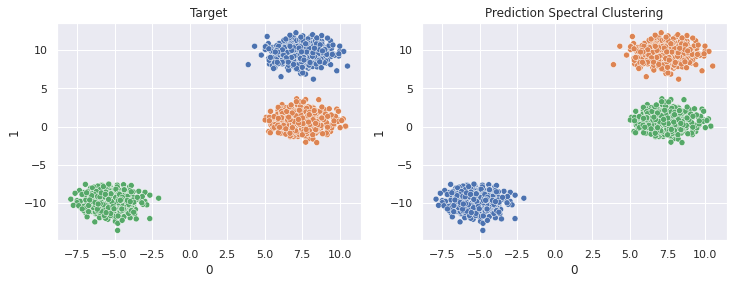

[Spectral Clustering]: accuracy 1.0000, time 0.636, mem 0.892Mb


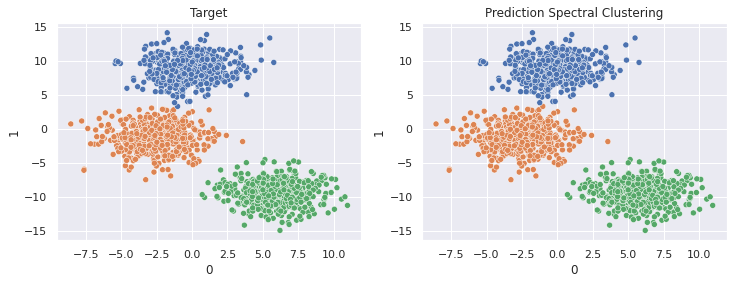

[Spectral Clustering]: accuracy 0.9991, time 0.364, mem 0.963Mb


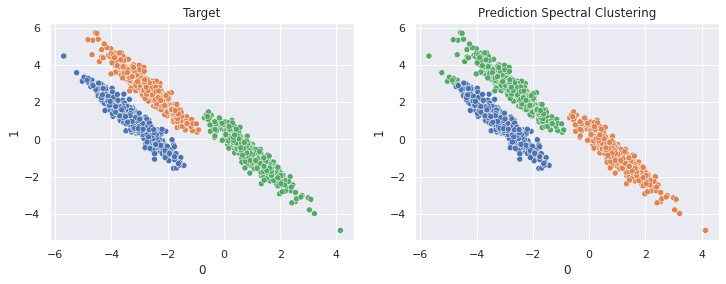

[Spectral Clustering]: accuracy 0.9886, time 0.701, mem 0.954Mb


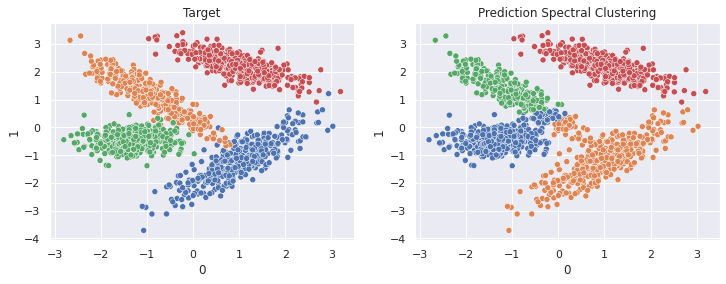

[Spectral Clustering]: accuracy 0.9478, time 0.493, mem 0.961Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


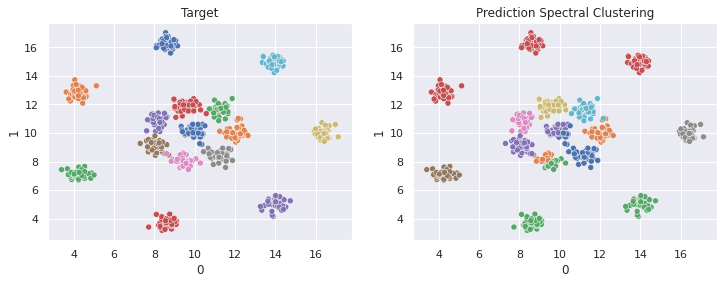

[Spectral Clustering]: accuracy 0.9764, time 0.351, mem 0.502Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


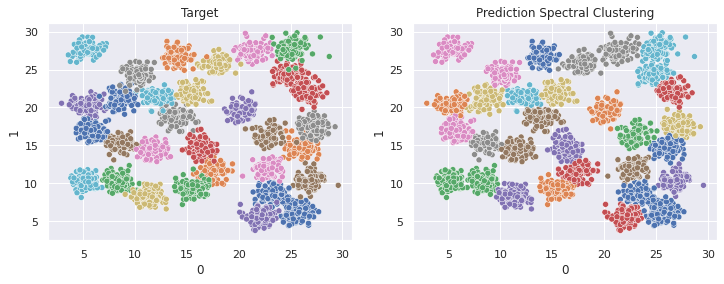

[Spectral Clustering]: accuracy 0.9965, time 1.364, mem 4.122Mb


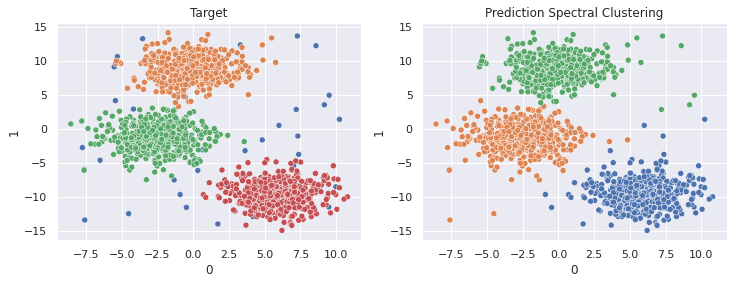

[Spectral Clustering]: accuracy 0.9791, time 0.370, mem 0.962Mb


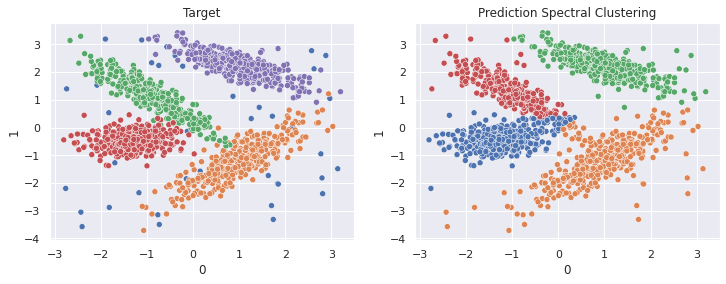

[Spectral Clustering]: accuracy 0.9482, time 0.520, mem 0.973Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


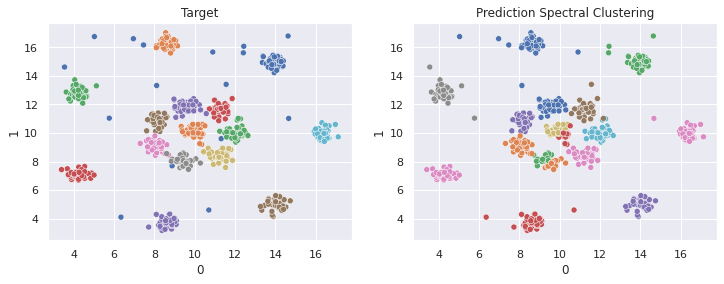

[Spectral Clustering]: accuracy 0.9646, time 0.616, mem 0.500Mb


In [18]:
run_SpectralClustering_on_data_with_K(GAUSSIAN_BLOBS_DATA, GAUSSIAN_BLOBS_K, "GAUSSIAN_BLOBS", path=ROOT_DATA)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

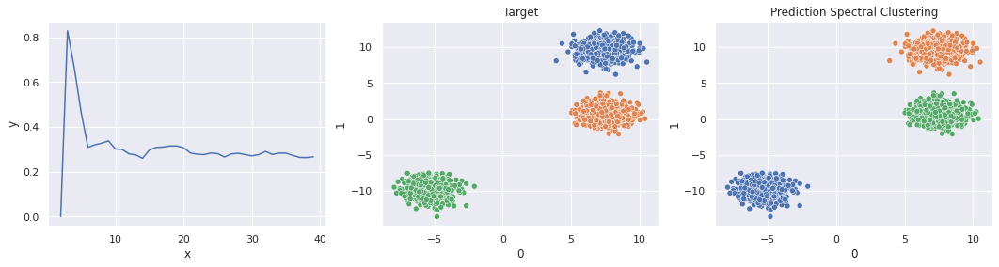

Best K = 3
[SpectralClustering]: accuracy 1.0000


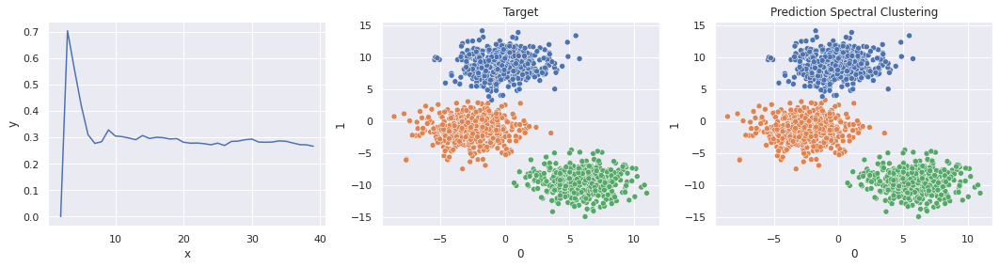

Best K = 3
[SpectralClustering]: accuracy 0.9991


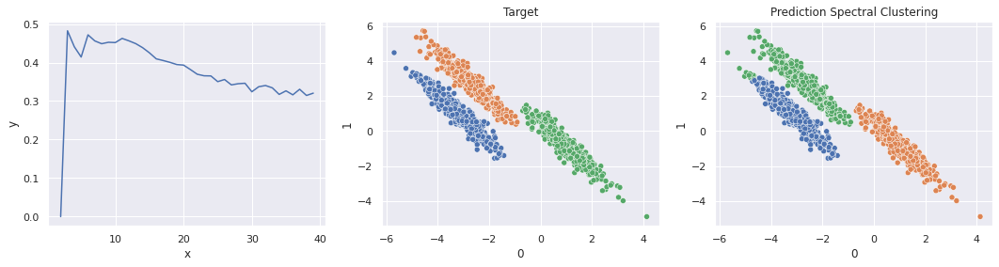

Best K = 3
[SpectralClustering]: accuracy 0.9886


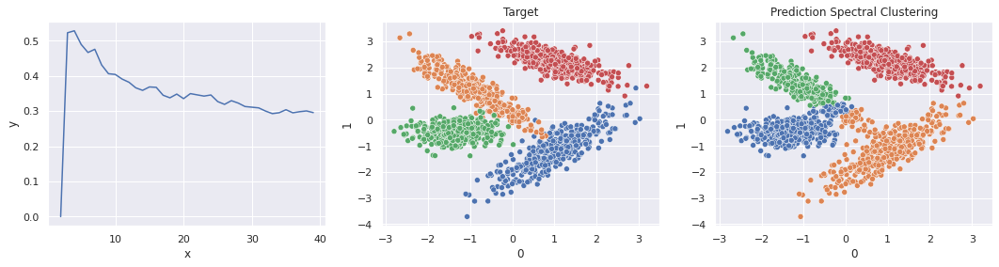

Best K = 4
[SpectralClustering]: accuracy 0.9478


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

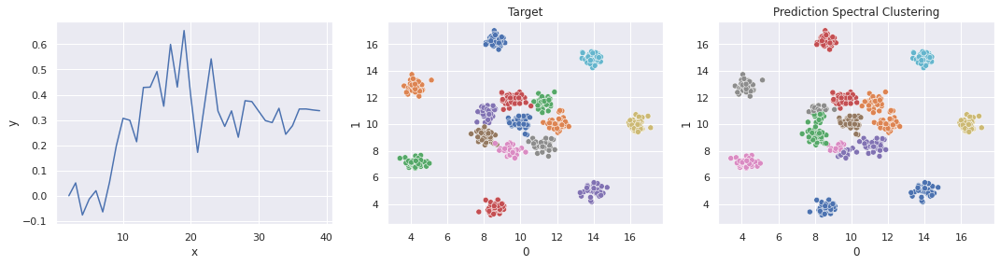

Best K = 19
[SpectralClustering]: accuracy 0.9891


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

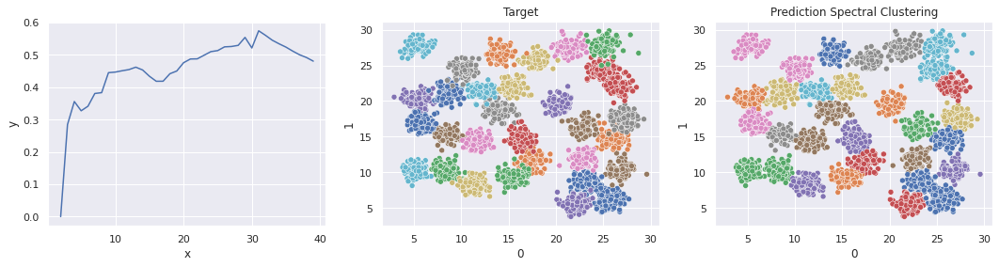

Best K = 31
[SpectralClustering]: accuracy 0.9965


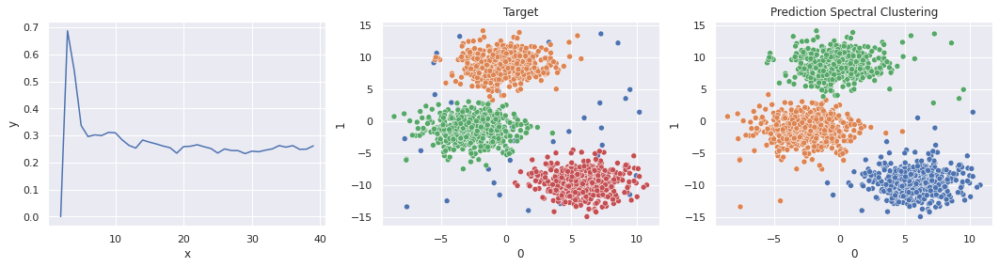

Best K = 3
[SpectralClustering]: accuracy 0.9791


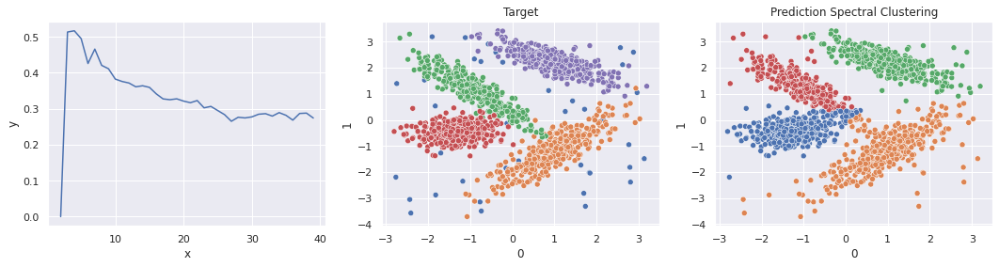

Best K = 4
[SpectralClustering]: accuracy 0.9482


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

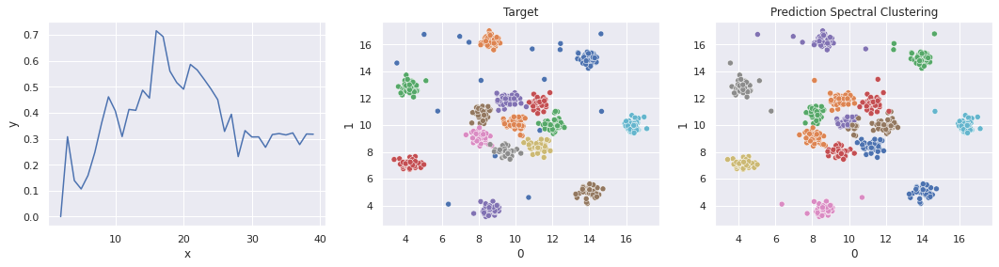

Best K = 16
[SpectralClustering]: accuracy 0.9922


In [19]:
run_SpectralClustering_on_data(GAUSSIAN_BLOBS_DATA, list(range(2, 40)), "GAUSSIAN_BLOBS", path=ROOT_DATA)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


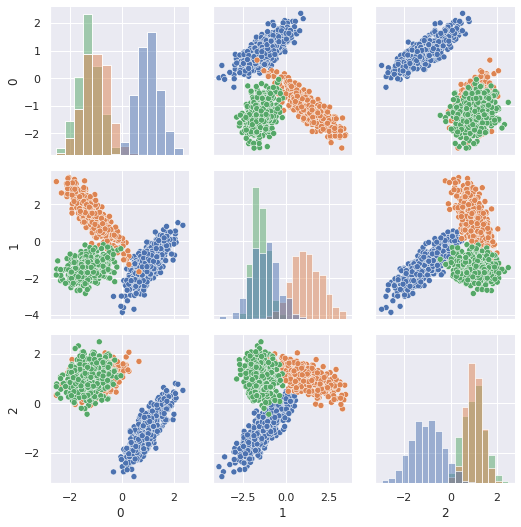

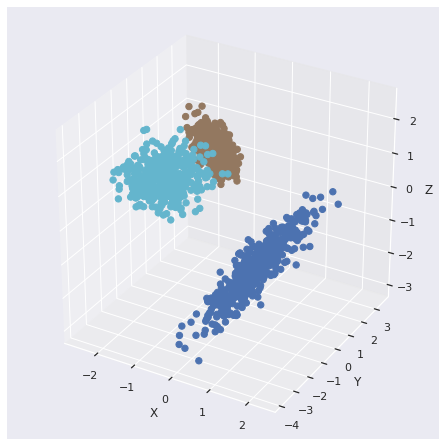

[Spectral Clustering]: accuracy 0.9667, time 0.417, mem 0.946Mb


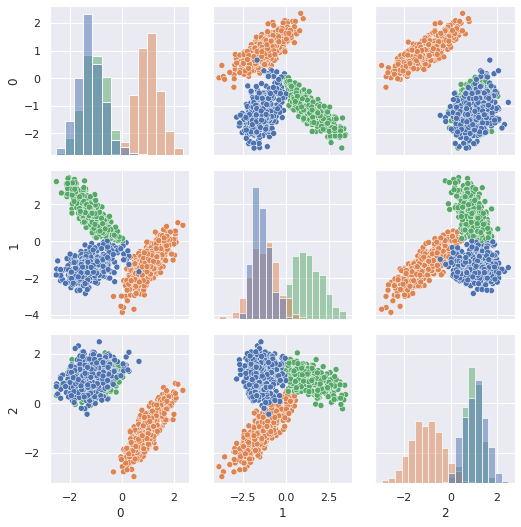

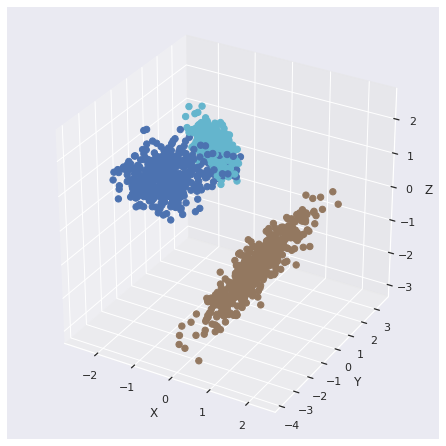

In [20]:
X, y = get_gaussian_data_3d()

run_on_3d_data(X, y, K=3, data_name="GAUSSIAN_BLOBS", path=ROOT_DATA)

### Unbalance Gaussian

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


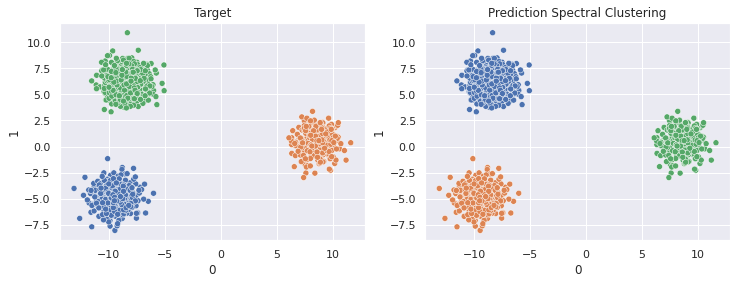

[Spectral Clustering]: accuracy 1.0000, time 0.609, mem 0.952Mb


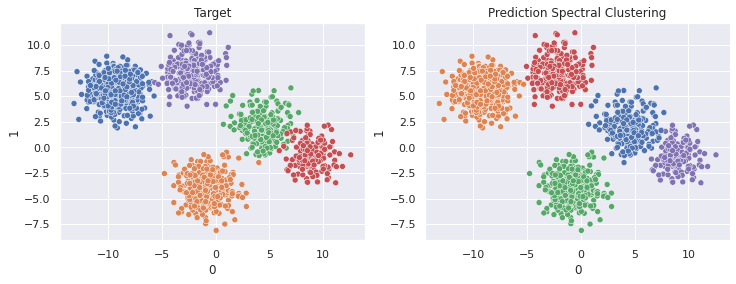

[Spectral Clustering]: accuracy 0.9955, time 0.410, mem 0.958Mb


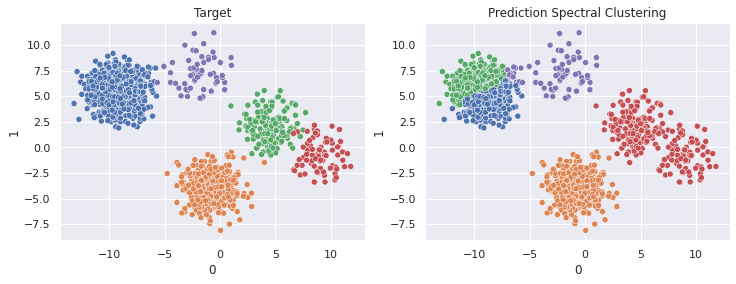

[Spectral Clustering]: accuracy 0.8301, time 0.505, mem 0.952Mb


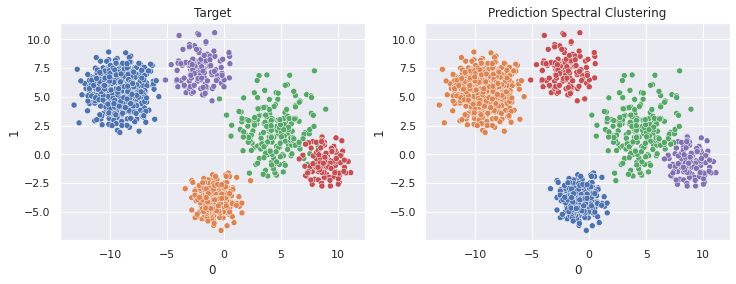

[Spectral Clustering]: accuracy 0.9970, time 0.410, mem 0.926Mb


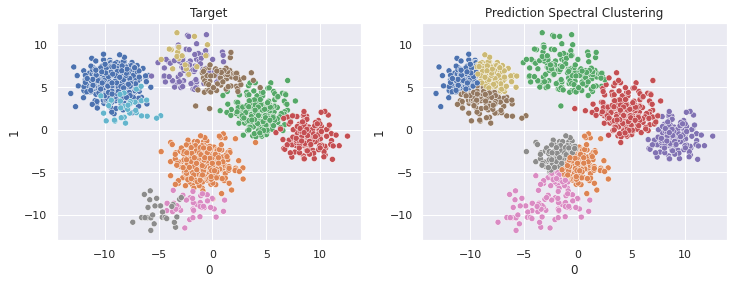

[Spectral Clustering]: accuracy 0.8682, time 0.827, mem 0.936Mb


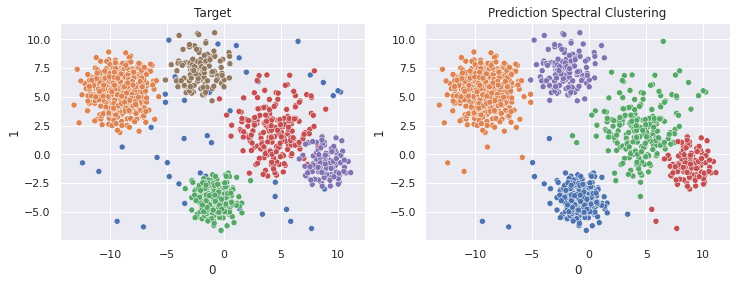

[Spectral Clustering]: accuracy 0.9852, time 0.524, mem 0.957Mb


In [21]:
run_SpectralClustering_on_data_with_K(UNBALANCED_GAUSSIAN_BLOBS_DATA, UNBALANCED_GAUSSIAN_BLOBS_K, "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

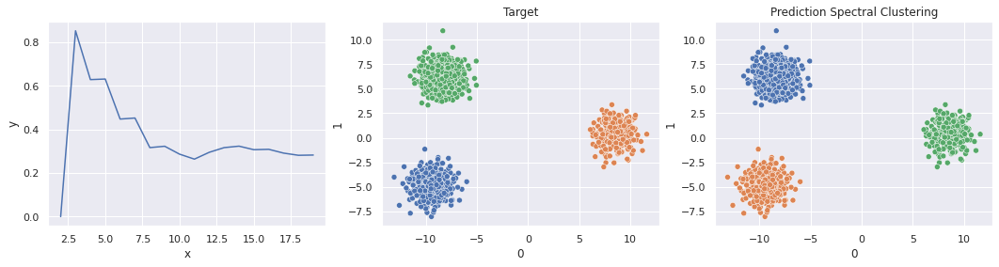

Best K = 3
[SpectralClustering]: accuracy 1.0000


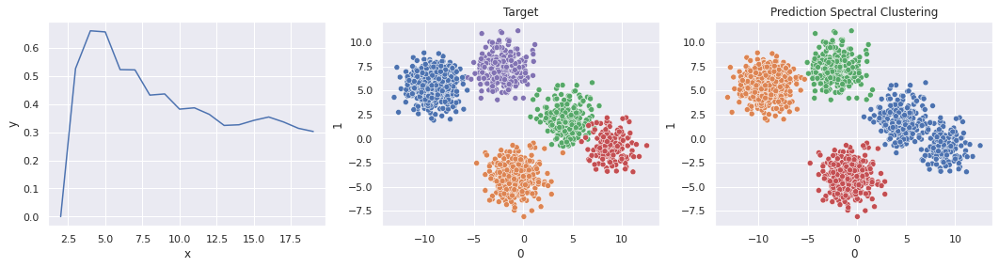

Best K = 4
[SpectralClustering]: accuracy 0.9687


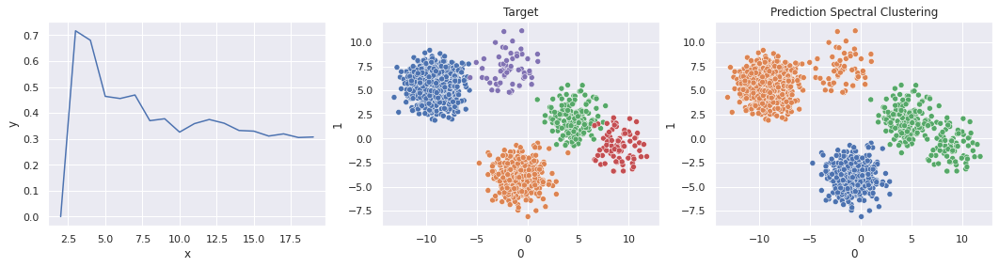

Best K = 3
[SpectralClustering]: accuracy 0.9428


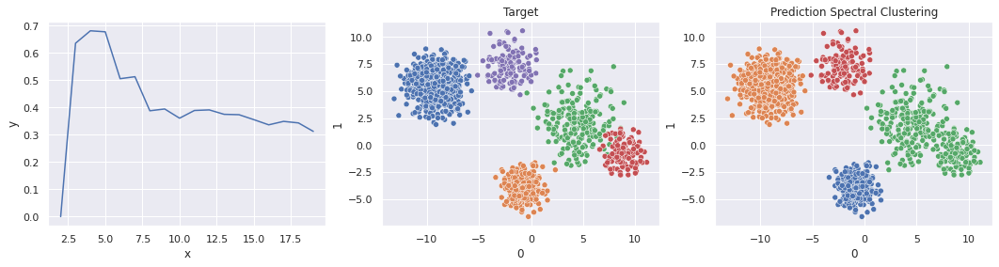

Best K = 4
[SpectralClustering]: accuracy 0.9789


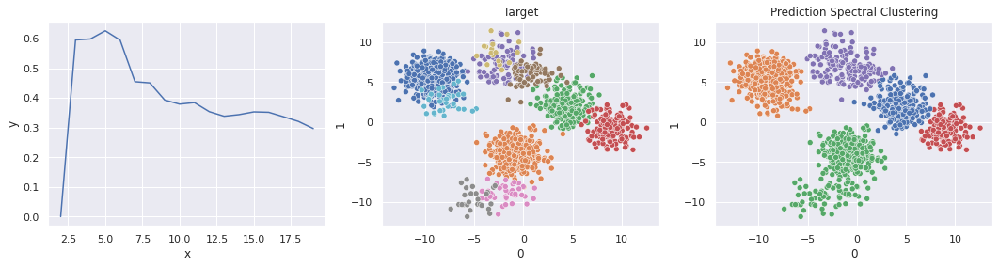

Best K = 5
[SpectralClustering]: accuracy 0.9511


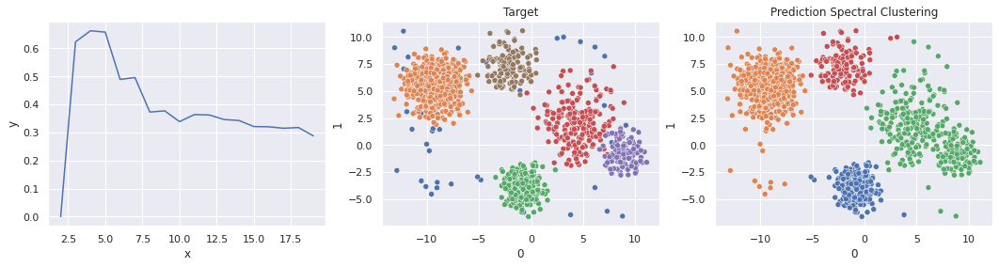

Best K = 4
[SpectralClustering]: accuracy 0.9600


In [22]:
run_SpectralClustering_on_data(UNBALANCED_GAUSSIAN_BLOBS_DATA, list(range(2, 20)), "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

### Cube

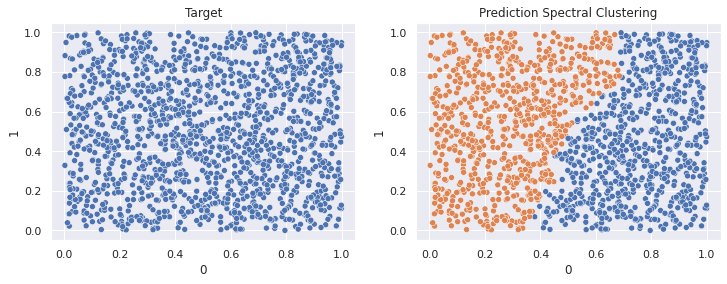

[Spectral Clustering]: accuracy 0.4999, time 0.730, mem 0.947Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


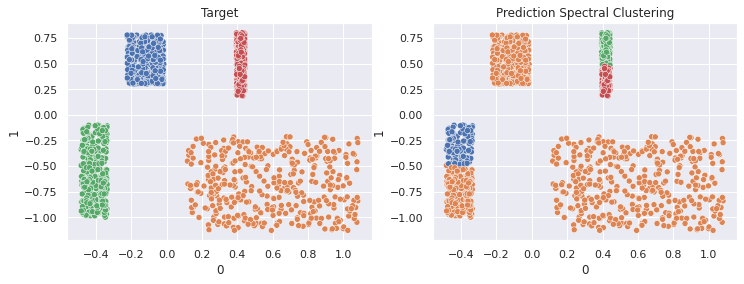

[Spectral Clustering]: accuracy 0.6562, time 0.695, mem 0.948Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


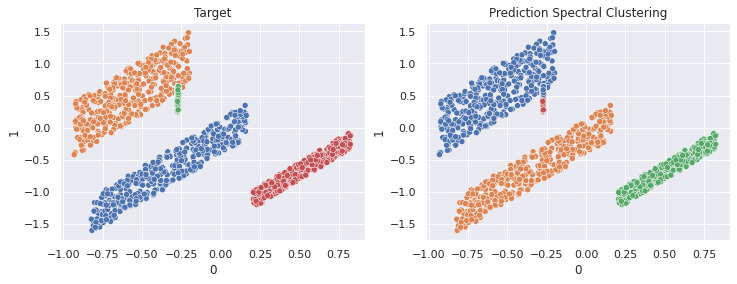

[Spectral Clustering]: accuracy 0.9101, time 1.106, mem 0.943Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


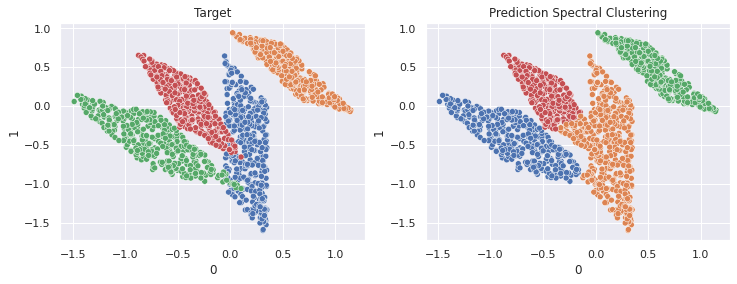

[Spectral Clustering]: accuracy 0.9334, time 0.729, mem 0.932Mb


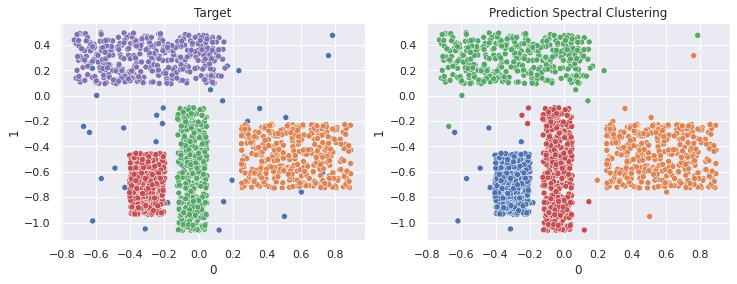

[Spectral Clustering]: accuracy 0.9848, time 0.537, mem 0.931Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


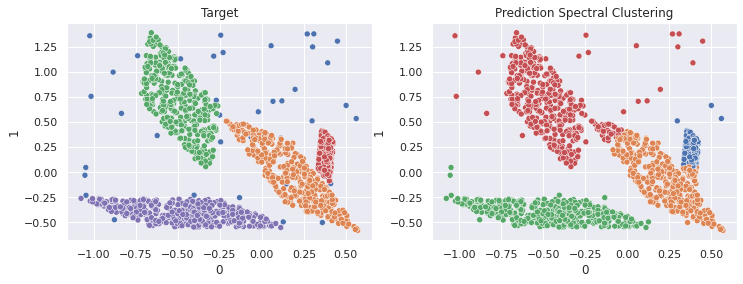

[Spectral Clustering]: accuracy 0.9203, time 0.631, mem 0.956Mb


In [23]:
run_SpectralClustering_on_data_with_K(CUBES_RECT_PARALLEL_DATA, CUBES_RECT_PARALLEL_K, "CUBES_RECT_PARALLEL", path=ROOT_DATA)

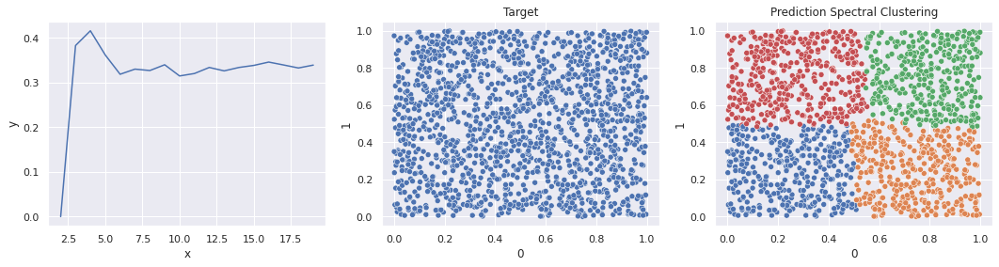

Best K = 4
[SpectralClustering]: accuracy 0.2502


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

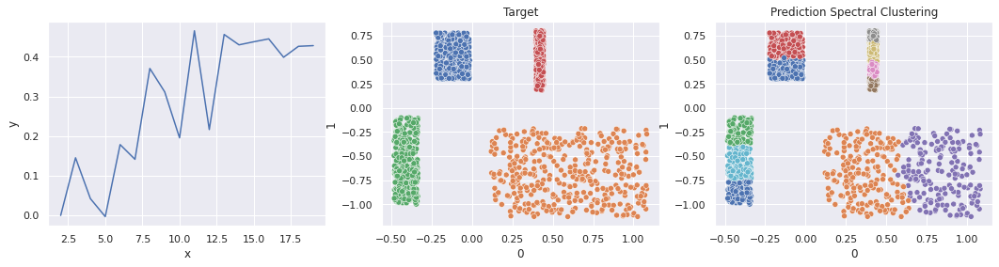

Best K = 11
[SpectralClustering]: accuracy 0.8504


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

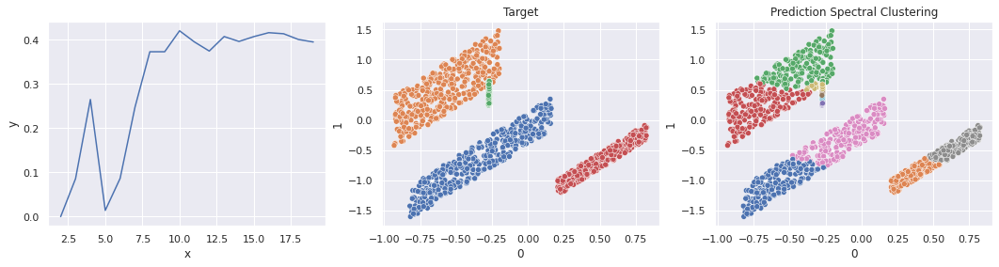

Best K = 10
[SpectralClustering]: accuracy 0.8525


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

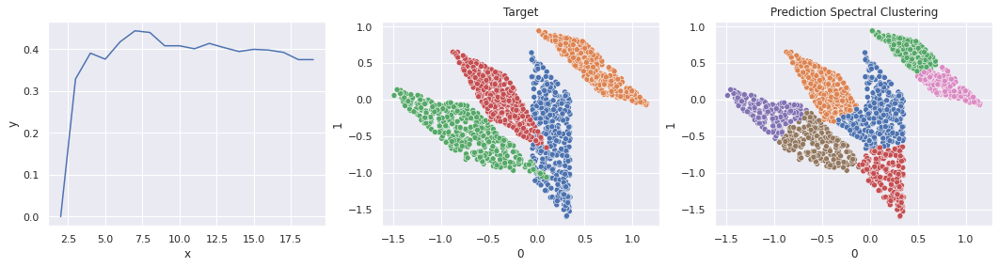

Best K = 7
[SpectralClustering]: accuracy 0.8618


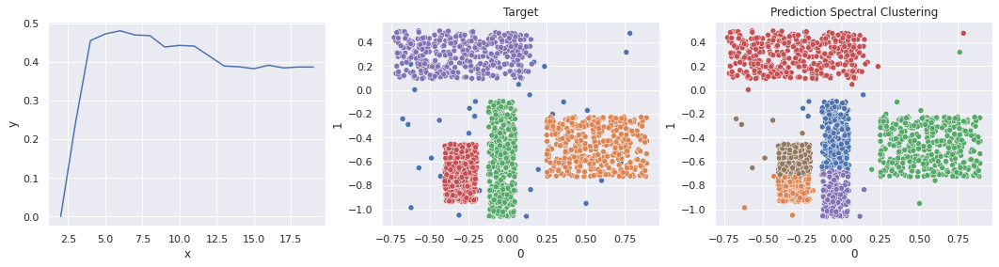

Best K = 6
[SpectralClustering]: accuracy 0.9309


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

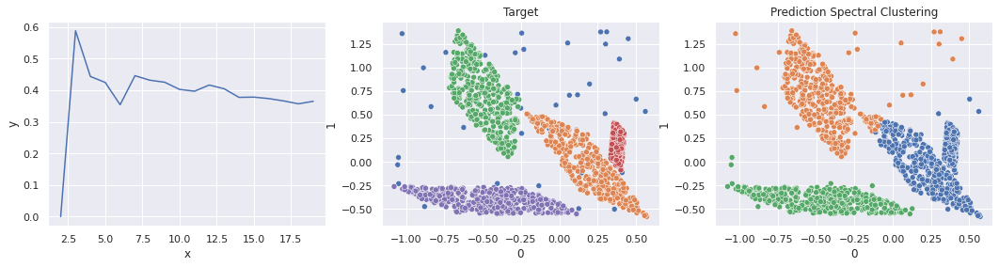

Best K = 3
[SpectralClustering]: accuracy 0.8566


In [24]:
run_SpectralClustering_on_data(CUBES_RECT_PARALLEL_DATA, list(range(2, 20)), "CUBES_RECT_PARALLEL", path=ROOT_DATA)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


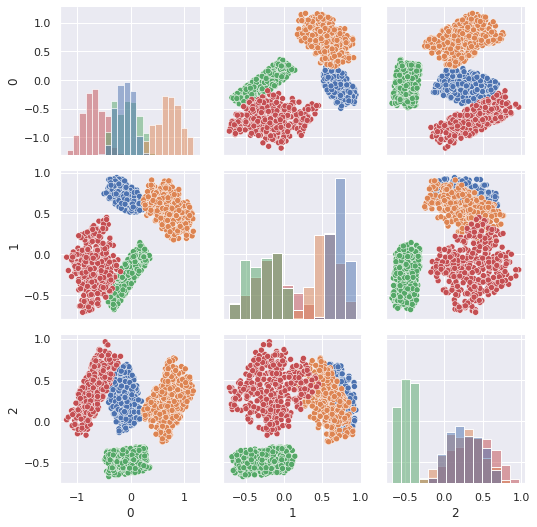

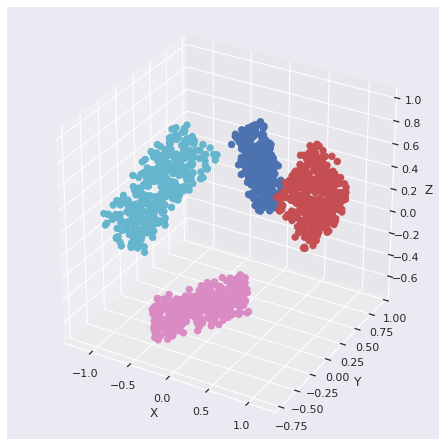

[Spectral Clustering]: accuracy 0.8920, time 0.352, mem 0.957Mb


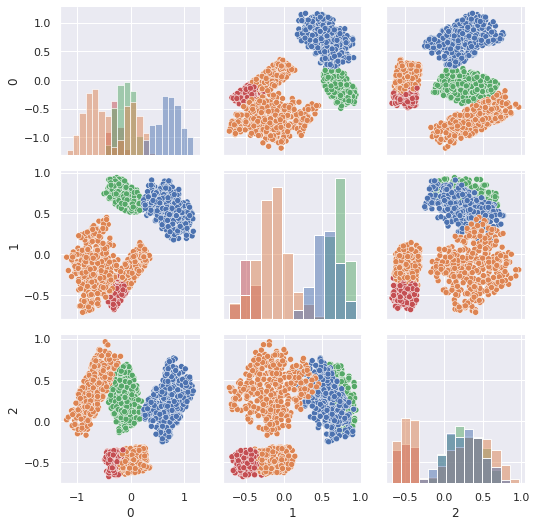

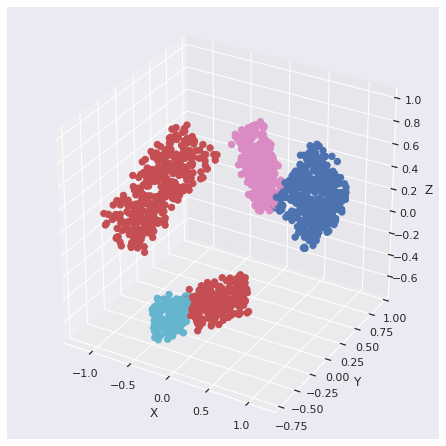

In [25]:
X, y = get_data_cube_3d()
run_on_3d_data(X, y, K=4, data_name="CUBES_RECT_PARALLEL", path=ROOT_DATA)

### Non-spherical

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


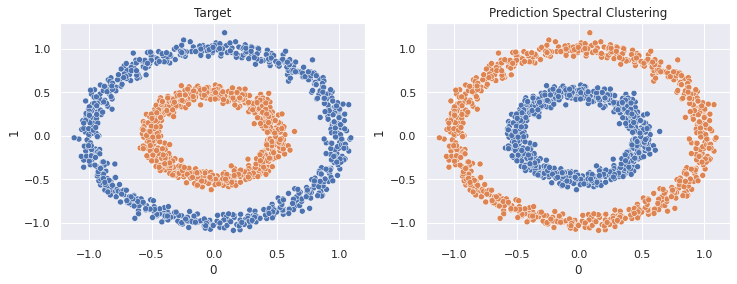

[Spectral Clustering]: accuracy 1.0000, time 1.474, mem 0.957Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


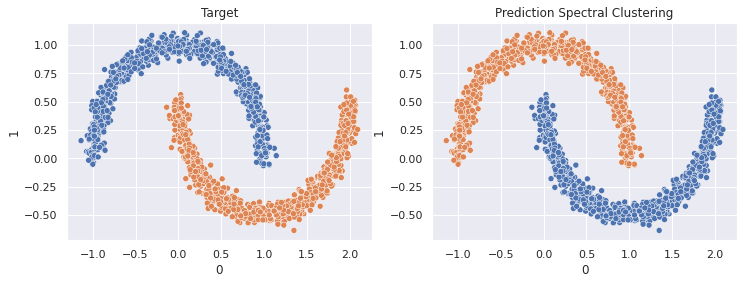

[Spectral Clustering]: accuracy 1.0000, time 1.972, mem 0.960Mb


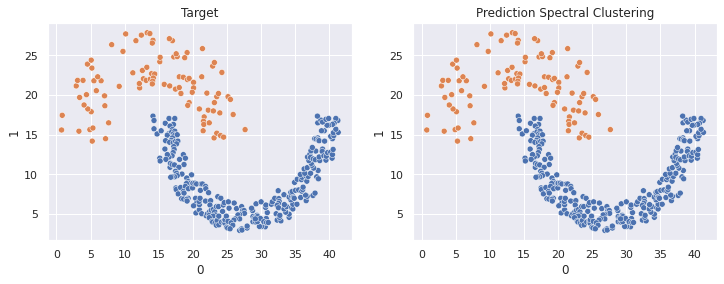

[Spectral Clustering]: accuracy 1.0000, time 0.119, mem 0.246Mb


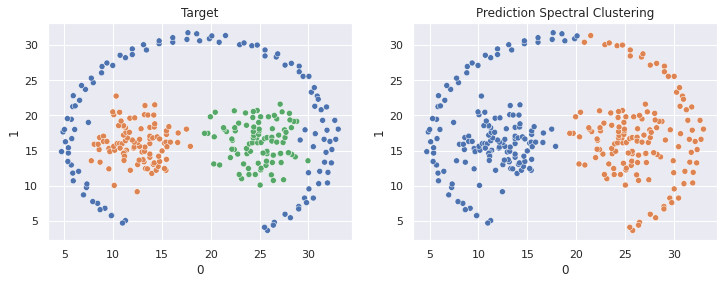

[Spectral Clustering]: accuracy 0.6996, time 0.099, mem 0.196Mb


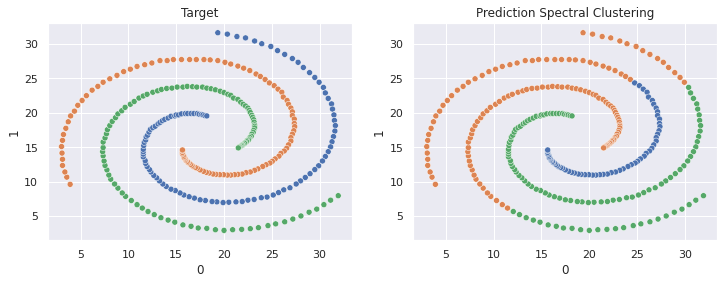

[Spectral Clustering]: accuracy 0.7223, time 0.121, mem 0.199Mb


In [26]:
run_SpectralClustering_on_data_with_K(NON_SPHERICAL_DATA, NON_SPHERICAL_K, "NON_SPHERICAL", path=ROOT_DATA)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

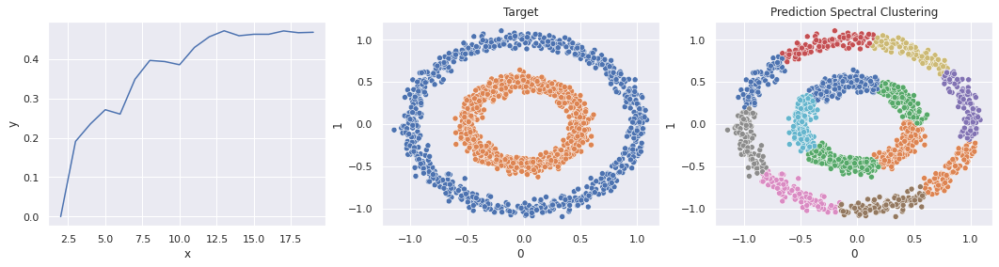

Best K = 13
[SpectralClustering]: accuracy 0.5814


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

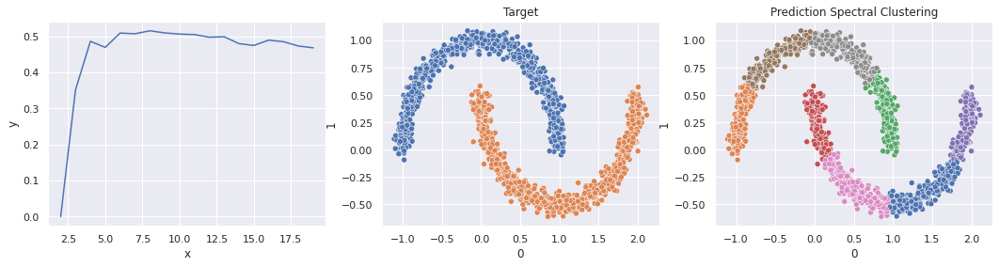

Best K = 8
[SpectralClustering]: accuracy 0.6290


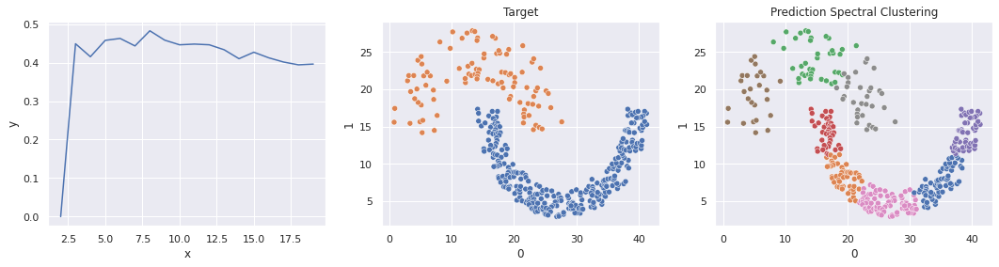

Best K = 8
[SpectralClustering]: accuracy 0.5220


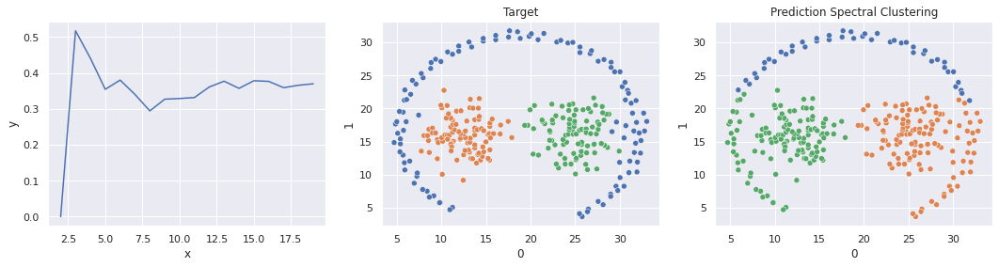

Best K = 3
[SpectralClustering]: accuracy 0.7762


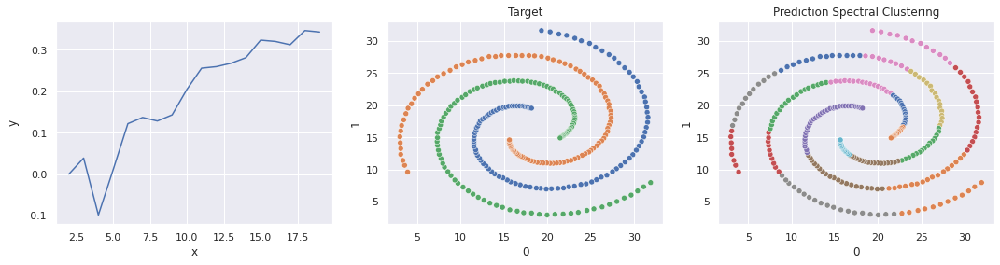

Best K = 18
[SpectralClustering]: accuracy 0.7082


In [27]:
run_SpectralClustering_on_data(NON_SPHERICAL_DATA, list(range(2, 20)), "NON_SPHERICAL", path=ROOT_DATA)

### Other forms

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


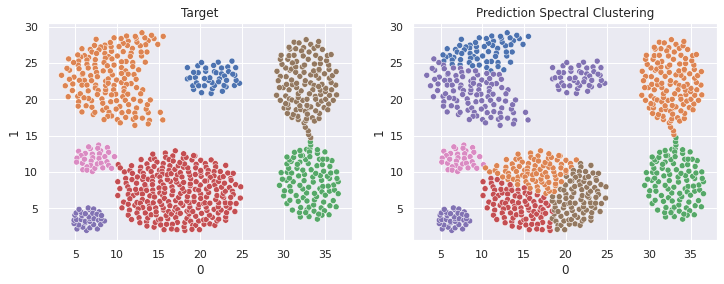

[Spectral Clustering]: accuracy 0.8292, time 0.344, mem 0.500Mb


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


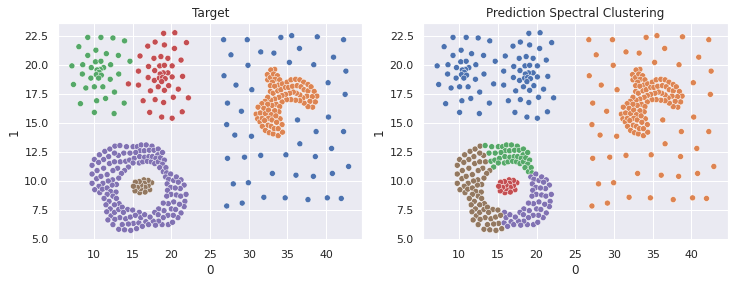

[Spectral Clustering]: accuracy 0.8185, time 0.163, mem 0.261Mb


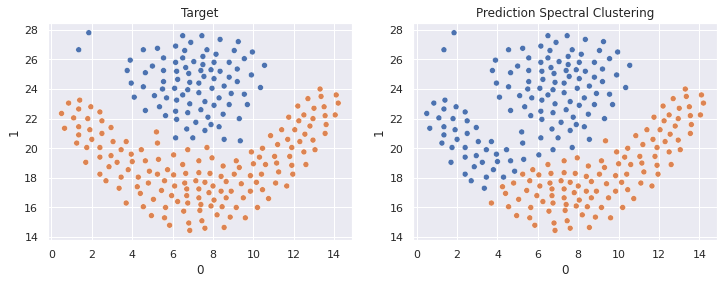

[Spectral Clustering]: accuracy 0.6940, time 0.093, mem 0.160Mb


In [28]:
run_SpectralClustering_on_data_with_K(OTHER_FORMS_DATA, OTHER_FORMS_K, "OTHER_FORMS", path=ROOT_DATA)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

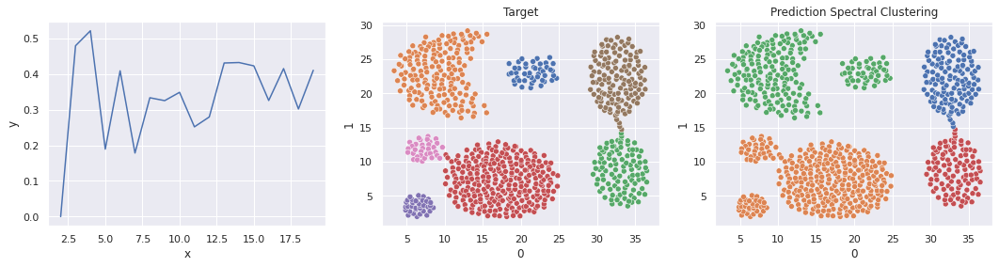

Best K = 4
[SpectralClustering]: accuracy 0.9110


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklea

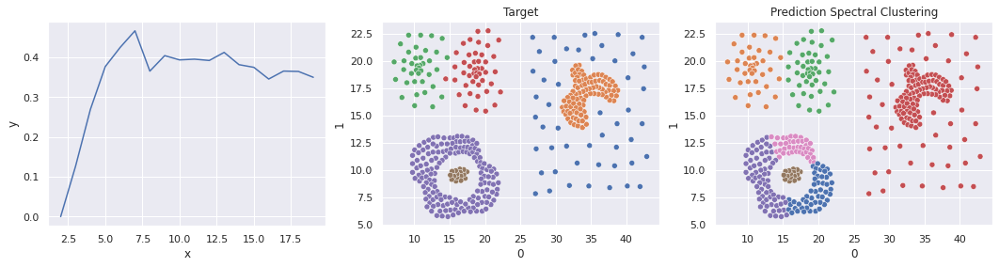

Best K = 7
[SpectralClustering]: accuracy 0.8390


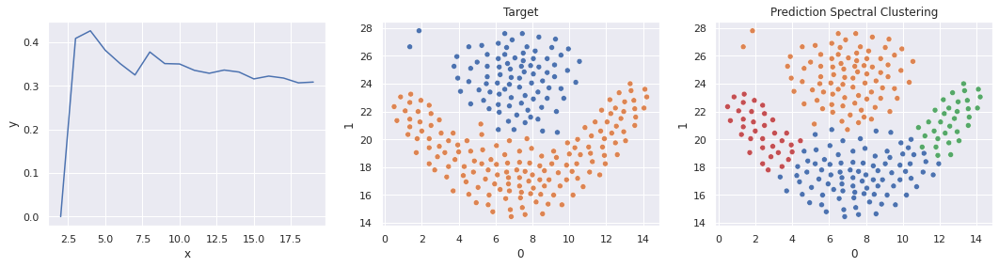

Best K = 4
[SpectralClustering]: accuracy 0.7381


In [29]:
run_SpectralClustering_on_data(OTHER_FORMS_DATA, list(range(2, 20)), "OTHER_FORMS", path=ROOT_DATA)

### Real dataset (Iris)

In [30]:
import pandas as pd
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

iris = datasets.load_iris()
iris_labels = iris.target
data = pd.DataFrame(iris.data,columns = iris.feature_names)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [31]:
scaler = MinMaxScaler()
data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,0.222222,0.625000,0.067797,0.041667
1,0.166667,0.416667,0.067797,0.041667
2,0.111111,0.500000,0.050847,0.041667
3,0.083333,0.458333,0.084746,0.041667
4,0.194444,0.666667,0.067797,0.041667


In [32]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(data)
PCA_iris_data = pd.DataFrame(data = principalComponents , columns = ['pc1', 'pc2','pc3'])

PCA_iris_data.head()

,pc1,pc2,pc3
0,-0.630703,0.107578,-0.018719
1,-0.622905,-0.104260,-0.049142
2,-0.669520,-0.051417,0.019644
3,-0.654153,-0.102885,0.023219
4,-0.648788,0.133488,0.015116


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


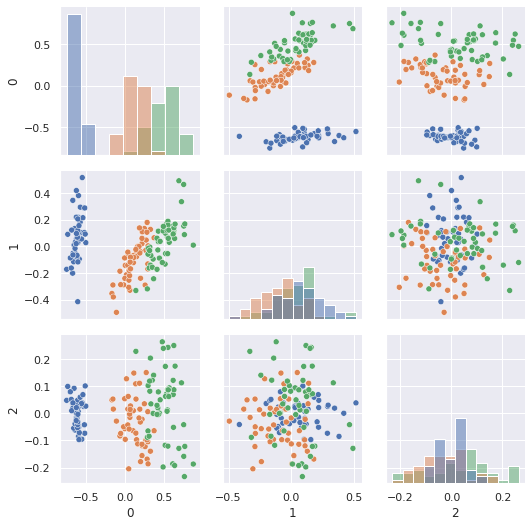

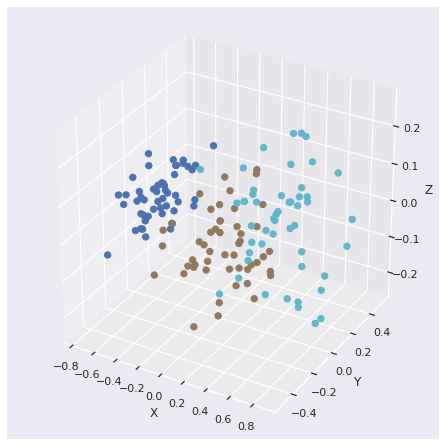

[Spectral Clustering]: accuracy 0.8923, time 0.062, mem 0.100Mb


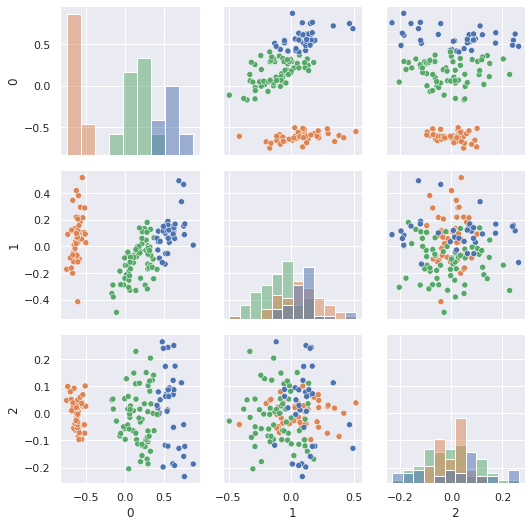

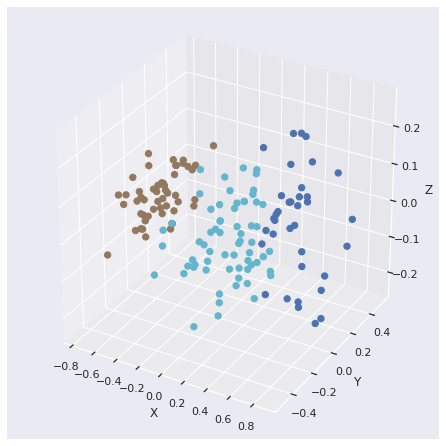

In [33]:
run_on_3d_data(PCA_iris_data.values, iris_labels, 3, data_name="Real_Data", path=ROOT_DATA)

## Time and Memory tests

In [34]:
from spectralclustering_utils import evaluation_time_of_working_by_k, evaluation_time_of_working_by_size, evaluation_mem_of_working_by_k, evaluation_mem_of_working_by_size

K_RANGE = [2, 3, 5, 8, 10, 15, 30]

 29%|██▊       | 2/7 [00:48<02:02, 24.45s/it]/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"

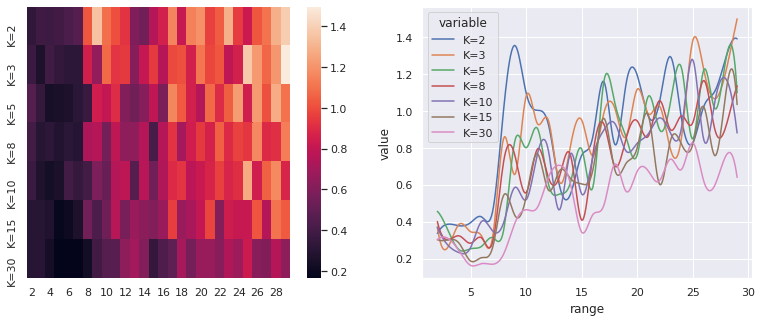

In [35]:
evaluation_time_of_working_by_k(K_RANGE, 
                                total_size=1200, 
                                path=ROOT_DATA)

  0%|          | 0/7 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/lo

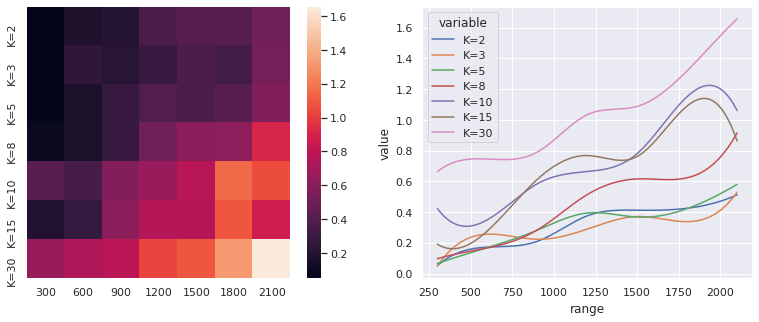

In [36]:
evaluation_time_of_working_by_size(7, 
                                   finding_k = K_RANGE,
                                   total_size = list(range(300, 2400, 300)),
                                   path=ROOT_DATA)

 29%|██▊       | 2/7 [00:52<02:13, 26.64s/it]/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"

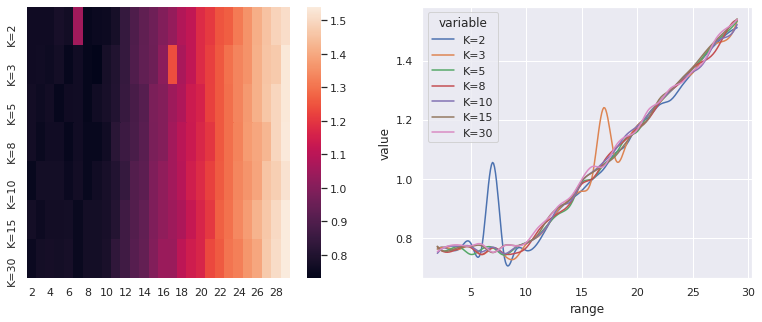

In [37]:
evaluation_mem_of_working_by_k(K_RANGE, 
                                total_size=1200, 
                                path=ROOT_DATA)

  0%|          | 0/7 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/lo

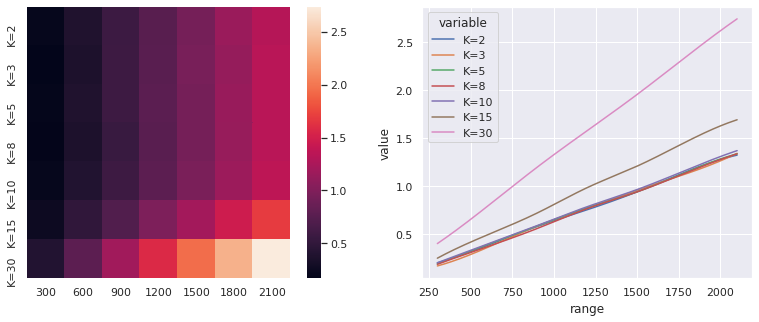

In [38]:
evaluation_mem_of_working_by_size(7,
                                  finding_k = K_RANGE,
                                  total_size = list(range(300, 2400, 300)),
                                  path=ROOT_DATA)

## Check Stability and Initial dependency 

In [39]:
from spectralclustering_utils import check_init_dependency, check_stability

 33%|███▎      | 2/6 [00:09<00:19,  4.89s/it]/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"

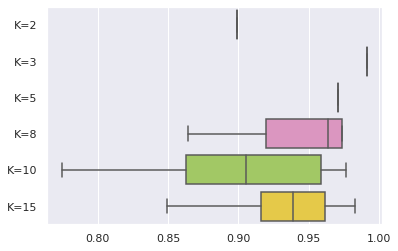

In [40]:
check_init_dependency(path=ROOT_DATA)

  0%|          | 0/6 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/lo

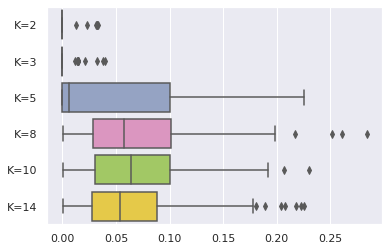

In [41]:
check_stability(path=ROOT_DATA)